<a href="https://colab.research.google.com/github/YayunEldina/PCVK_Ganjil_2024/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**D. PRAKTIKUM**

In [4]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


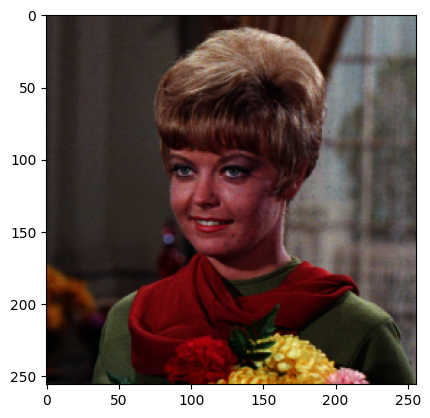

In [14]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
img = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff')
image_2 = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(image_2)

 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 50


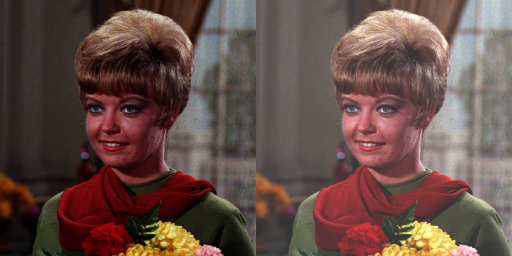

In [10]:
print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
	brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
	print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per pixel
for y in range(original.shape[0]):
	for x in range(original.shape[1]):
		for c in range(original.shape[2]):
			brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

# cara simple tanpa for loop
# brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

**E. TUGAS PRAKTIKUM**

1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

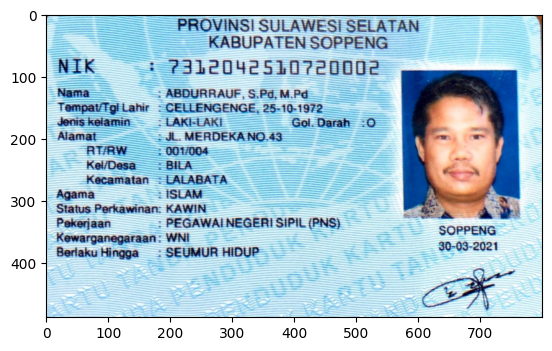

In [119]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
img = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP7.jpeg')
image_2 = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(image_2)

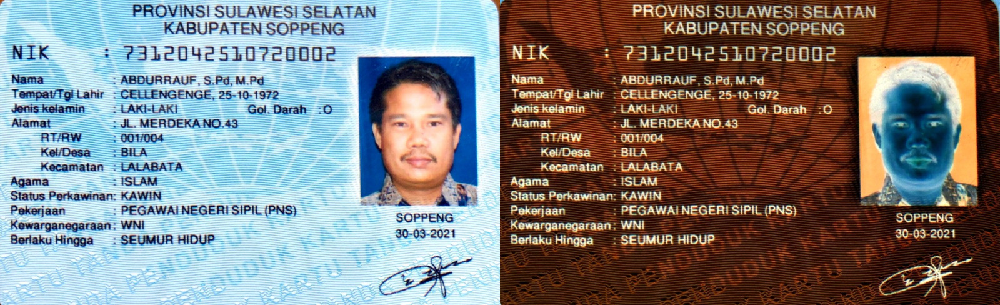

In [111]:
# Membaca citra
img = cv2.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP7.jpeg')

# Membuat citra negatif
inverted_img = 255 - img

# Menampilkan hasil
final_frame = cv.hconcat((img, inverted_img))
cv2_imshow(final_frame)

2. Implementasikan transformasi contrast pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga menghasilkan keluaran seperti berikut:

Mengubah kontras dan tingkat kecerahan citra
------------------------------------------------------------------------
Masukkan tingkat [-255 - 255]: 50
Masukkan kontras [1.0 - 3.0: 2


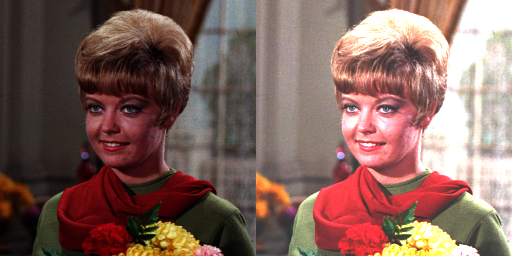

In [39]:
print('Mengubah kontras dan tingkat kecerahan citra')
print('------------------------------------------------------------------------')

try:
  brightness = int(input('Masukkan tingkat [-255 - 255]: '))
  contrast = int(input('Masukkan kontras [1.0 - 3.0: '))
except ValueError:
  print('Error: Nilai yang dimasukkan harus berupa angka.')


# Load citra
original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per pixel
for y in range(original.shape[0]):
	for x in range(original.shape[1]):
		for c in range(original.shape[2]):
			brightness_image[y,x,c] = np.clip(contrast * original[y,x,c] + brightness, 0, 255)

# Menggabungkan citra asli dan hasil untuk perbandingan
final_frame = cv.hconcat([original, brightness_image])

# Menampilkan hasil
cv2_imshow(final_frame)

3. Implementasikan transformasi logarithmic brightness pada Google Colaboratory
menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi
log, sehingga menghasilkan keluaran seperti berikut:

Mengubah tingkat kecerahan citra dengan Transformasi Log
----------------------------------
Masukkan nilai kecerahan: 50


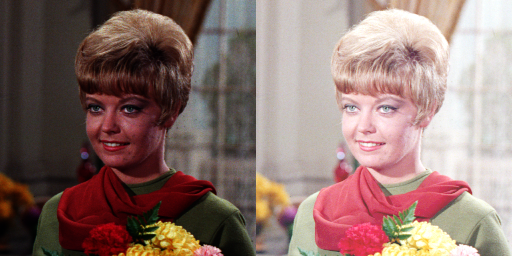

In [58]:
print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
print('----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

# Akses per pixel untuk penyesuaian kecerahan
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(brightness * np.log1p(1 + original[y,x,c]), 0, 255)

# Cara simple tanpa for loop
# brightness_image = cv.convertScaleAbs(original, beta=brightness)

# Menyusun citra akhir tanpa gambar tengah
final_frame = cv.hconcat((original,  brightness_image))
cv2_imshow(final_frame)


4. Implementasikan transformasi grayscale menggunakan metode averaging, lightness,
dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada
bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:


a.  Averaging

Grayscale averaging
--------------------


<ipython-input-134-a7777eb70500>:22: RuntimeWarning: overflow encountered in scalar add
  gray_avg[y, x] = (R + G + B) // 3  # Use integer division


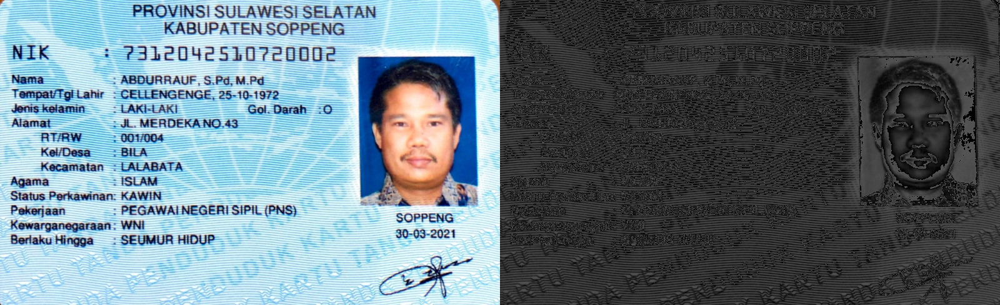

In [134]:

print('Grayscale averaging')
print('--------------------')

# Load the image
original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP7.jpeg')

# Check if the image was loaded successfully
if original is None:
    print("Error: Image not found. Please check the file path.")
else:
    # Create an empty grayscale image
    gray_avg = np.zeros((original.shape[0], original.shape[1]), dtype=np.uint8)

    # Access each pixel to compute grayscale value using averaging
    for y in range(original.shape[0]):
        for x in range(original.shape[1]):
            R = original[y, x, 0]
            G = original[y, x, 1]
            B = original[y, x, 2]
            # Compute average grayscale value and assign to the grayscale image
            gray_avg[y, x] = (R + G + B) // 3  # Use integer division

    # Convert the grayscale image to BGR for concatenation
    gray_avg_bgr = cv.cvtColor(gray_avg, cv.COLOR_GRAY2BGR)

    # Concatenate the original and grayscale images
    final_frame = cv.hconcat([original, gray_avg_bgr])

    # Display the result
    cv2_imshow(final_frame)


b.  Lightness

Grayscale lightness
--------------------


<ipython-input-141-802e1ad3bb46>:29: RuntimeWarning: overflow encountered in scalar add
  gray_lightness[y, x] = (max_val + min_val) // 2  # Use integer division


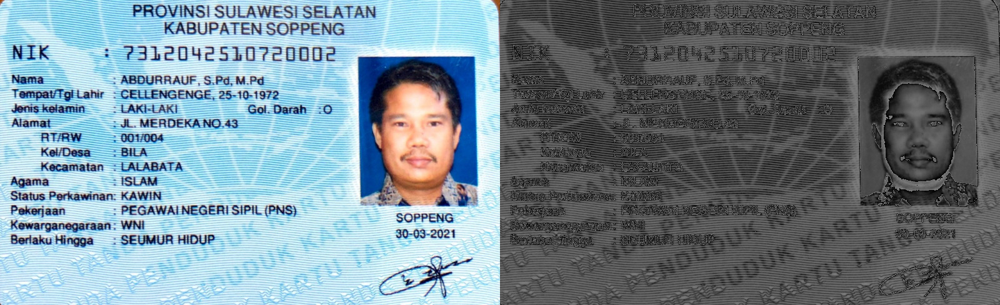

In [141]:
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print('Grayscale lightness')
print('--------------------')

# Load the image
original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP7.jpeg')


# Check if the image was loaded successfully
if original is None:
    print("Error: Image not found. Please check the file path.")
else:
    # Create an empty grayscale image
    gray_lightness = np.zeros((original.shape[0], original.shape[1]), dtype=np.uint8)

    # Access each pixel to compute grayscale value using lightness
    for y in range(original.shape[0]):
        for x in range(original.shape[1]):
            R = original[y, x, 0]
            G = original[y, x, 1]
            B = original[y, x, 2]
            # Compute lightness and assign to grayscale image
            max_val = max(R, G, B)
            min_val = min(R, G, B)
            gray_lightness[y, x] = (max_val + min_val) // 2  # Use integer division

    # Convert the grayscale image to BGR for concatenation
    gray_lightness_bgr = cv.cvtColor(gray_lightness, cv.COLOR_GRAY2BGR)

    # Concatenate the original and grayscale images
    final_frame = cv.hconcat([original, gray_lightness_bgr])

    # Display the result
    cv2_imshow(final_frame)


c. Luminance

Grayscale luminance
--------------------


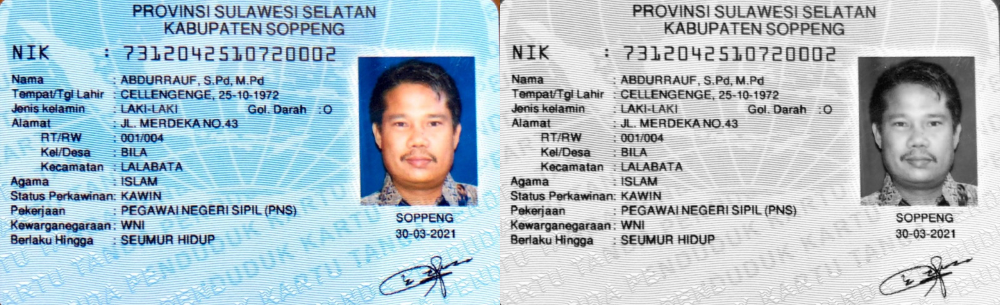

In [131]:
print('Grayscale luminance')
print('--------------------')

# Load the image
original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP7.jpeg')

# Check if the image was loaded successfully
if original is None:
    print("Error: Image not found. Please check the file path.")
else:
    # Create an empty grayscale image
    gray_luminance = np.zeros((original.shape[0], original.shape[1]), dtype=np.uint8)

    # Access each pixel to compute grayscale value using luminance
    for y in range(original.shape[0]):
        for x in range(original.shape[1]):
            R = original[y, x, 0]
            G = original[y, x, 1]
            B = original[y, x, 2]
            # Compute luminance and assign to grayscale image
            gray_luminance[y, x] = int(0.299 * R + 0.587 * G + 0.114 * B)

    # Convert the grayscale image to BGR for concatenation
    gray_luminance_bgr = cv.cvtColor(gray_luminance, cv.COLOR_GRAY2BGR)

    # Concatenate the original and grayscale images
    final_frame = cv.hconcat([original, gray_luminance_bgr])

    # Display the result
    cv2_imshow(final_frame)


5. Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal, tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna biru menjadi grayscale seperti pada contoh berikut:

Highlight Specific Color
------------------------


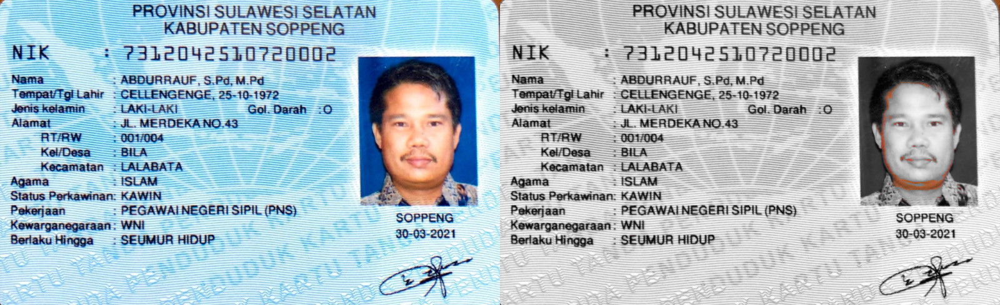

In [130]:
print('Highlight Specific Color')
print('------------------------')

# Load the image
original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP7.jpeg')

# Check if the image was loaded successfully
if original is None:
    print("Error: Image not found. Please check the file path.")
else:
    # Convert the image to grayscale
    gray_image = cv.cvtColor(original, cv.COLOR_BGR2GRAY)

    # Convert grayscale to BGR for concatenation
    gray_bgr = cv.cvtColor(gray_image, cv.COLOR_GRAY2BGR)

    # Define the color range for detection (blue color range in BGR format)
    lower_blue = np.array([0, 0, 100])
    upper_blue = np.array([100, 100, 255])

    # Create a mask for detecting blue color
    mask = cv.inRange(original, lower_blue, upper_blue)

    # Create an image to highlight blue areas
    highlighted_image = np.where(mask[:, :, None].astype(bool), original, gray_bgr)

    # Concatenate the original and highlighted images
    final_frame = cv.hconcat([original, highlighted_image])

    # Display the result
    cv2_imshow(final_frame)
